In [1]:
import anndata as ad
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

ST_PATH = "/scratch/gpfs/ph3641/mgw/sma_data/adata_st_V11T17-102_A1.h5ad"
MSI_PATH = "/scratch/gpfs/ph3641/mgw/sma_data/adata_msi_V11T17-102_A1.h5ad"

st = ad.read_h5ad(ST_PATH)
msi = ad.read_h5ad(MSI_PATH)

dop = pd.read_csv(
    "/scratch/gpfs/ph3641/mgw/sma_data/mendeley_all/Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues/"
    "processed/sma/sma/V11T17-102/V11T17-102_A1/output_data/V11T17-102_A1_RNA/outs/dopamine.csv"
)

# merge on barcode (Visium barcode format matches .obs_names)
dop = dop.rename(columns={"Barcode": "barcode"})
st.obs = st.obs.merge(dop, how="left", left_index=True, right_on="barcode")
st.obs["dopamine"] = st.obs["dopamine"].astype("category")
print(st.obs["dopamine"].value_counts())


dopamine
not_dopamine_Cd    3745
CI                  939
dopamine_Cd         257
Name: count, dtype: int64


In [2]:
dop

,barcode,dopamine
0,AAACAACGAATAGTTC-1,not_dopamine_Cd
1,AAACAAGTATCTCCCA-1,CI
2,AAACAATCTACTAGCA-1,not_dopamine_Cd
3,AAACACCAATAACTGC-1,not_dopamine_Cd
4,AAACAGAGCGACTCCT-1,not_dopamine_Cd
...,...,...
4963,TTGTTTCACATCCAGG-1,not_dopamine_Cd
4964,TTGTTTCATTAGTCTA-1,not_dopamine_Cd
4965,TTGTTTCCATACAACT-1,not_dopamine_Cd
4966,TTGTTTGTATTACACG-1,not_dopamine_Cd


In [3]:
msi.shape

(4030, 1538)

/home/ph3641/.conda/envs/peterenv2/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/ph3641/.conda/envs/peterenv2/lib/python3.10/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/home/ph3641/.conda/envs/peterenv2/lib/python3.10/site-packages/anndata/utils.py:434: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


             I  pval_norm  var_norm  pval_norm_fdr_bh
1052  0.926655        0.0  0.000075               0.0
1051  0.898452        0.0  0.000075               0.0
454   0.855806        0.0  0.000075               0.0
1057  0.852458        0.0  0.000075               0.0
1058  0.847360        0.0  0.000075               0.0
Before: (4030, 1538)  |  marked spatially variable: 20/1538
After:  (4030, 20)


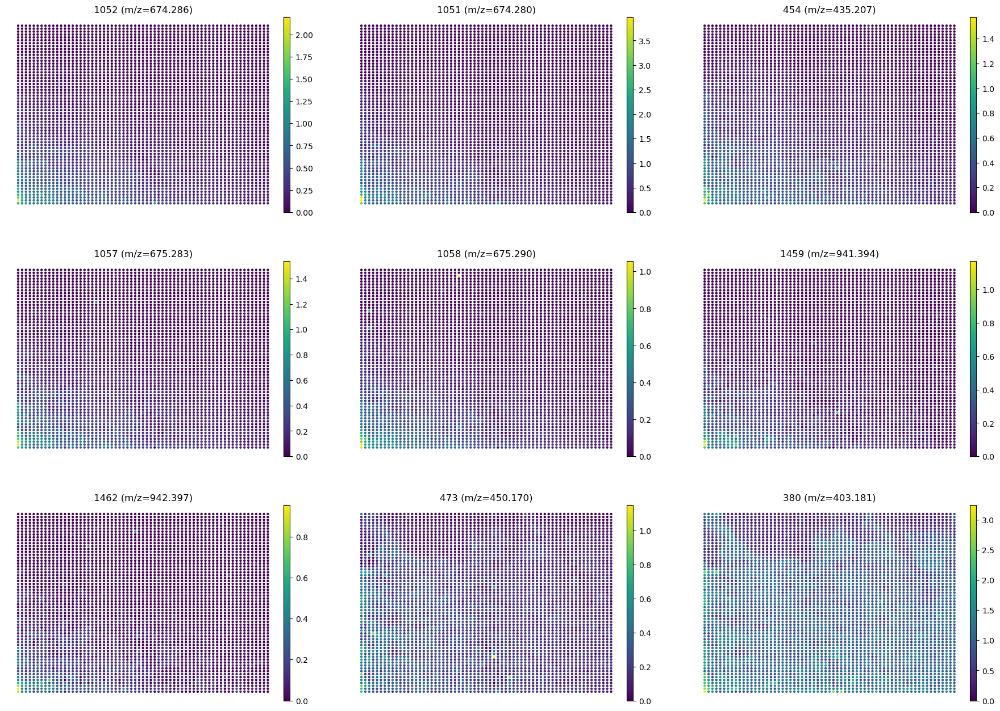

In [4]:
import squidpy as sq
import scanpy as sc

K = 20

sc.pp.normalize_total(msi, target_sum=1e3)

sq.gr.spatial_neighbors(msi, key_added='spatial')
sq.gr.spatial_autocorr(
    msi,
    mode="moran",
    genes=None,
    layer=None,
    n_jobs=8,
)
top_moran = (
    msi.uns["moranI"]
    .sort_values("I", ascending=False)
    .head(K)
)
msi.var["highly_variable_moranI"] = msi.var_names.isin(top_moran.index)

# 1) sanity-check what squidpy returned
print(msi.uns["moranI"].head())         # make sure there's an "I" column and feature names align

# 2) build the mask robustly (handle cases where the result has a 'names' column)
moran_df = msi.uns["moranI"]
if "names" in moran_df.columns:          # some squidpy versions put feature names here
    ranked = moran_df.sort_values("I", ascending=False)["names"].head(K)
else:
    ranked = moran_df.sort_values("I", ascending=False).index[:K]

msi.var["highly_variable_moranI"] = msi.var_names.isin(ranked)

# 3) show counts BEFORE subsetting
n_total = msi.shape[1]
n_keep  = int(msi.var["highly_variable_moranI"].sum())
print(f"Before: {msi.shape}  |  marked spatially variable: {n_keep}/{n_total}")

# 4) actually FILTER columns (variables)
msi = msi[:, msi.var["highly_variable_moranI"]].copy()

# 5) show counts AFTER subsetting
print("After: ", msi.shape)

moran = msi.uns["moranI"]
if "names" in moran.columns:
    ranked = moran.sort_values("I", ascending=False)["names"].tolist()
else:
    ranked = moran.sort_values("I", ascending=False).index.tolist()

top_k = 9
top_feats = ranked[:top_k]
msi.obsm["X_spatial"] = msi.obsm["spatial"]
display_names = [f"{gene} (m/z={msi.var.loc[gene, 'mz']:.3f})" for gene in top_feats]

import scanpy as sc
sc.pl.embedding(
    msi,
    basis="spatial",
    color=top_feats,
    ncols=3,
    frameon=False,
    size=40,
    title=display_names
)


/home/ph3641/.conda/envs/peterenv2/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/ph3641/ManifoldAlignment/mgw/util.py:247: UserWarning: Ignoring svd_solver='auto' and using randomized, sklearn.decomposition._truncated_svd.TruncatedSVD only supports dict_keys(['arpack', 'randomized']).
  sc.tl.pca(


[mgw.pre] PCA/raw shapes: X=(4968, 8)  Z=(4030, 20)
[mgw.pre] CCA feeler: PCA → small GW (fused) → barycentric → CCA
Using precomputed PCA (8 comps).
Computing PCA (8 comps)...
Feature shapes -> X: (4968, 8) Z: (4030, 8)
Feeler GW sizes: X-side 4968, Z-side 4030
Solving feeler feature alignment.
Computing CCA Components
CCA dims: 3  (applied to full sets)
[mgw.core] device=cuda dtype=torch.float64
[mgw.core] dims: E=2, F_M=3, F_N=3
[mgw.core] loading cached φ, ψ


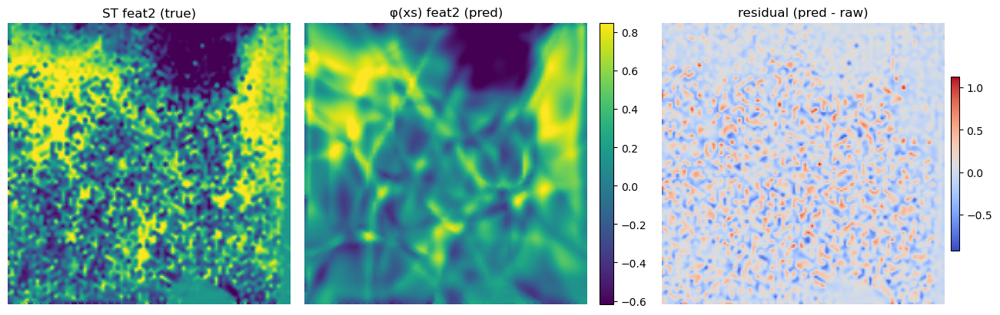

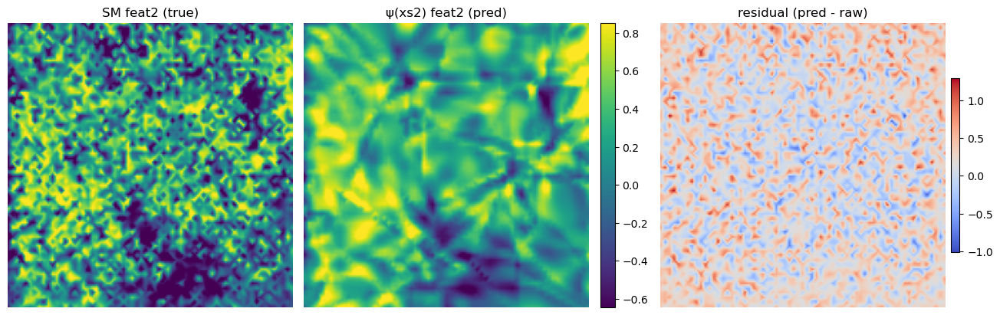

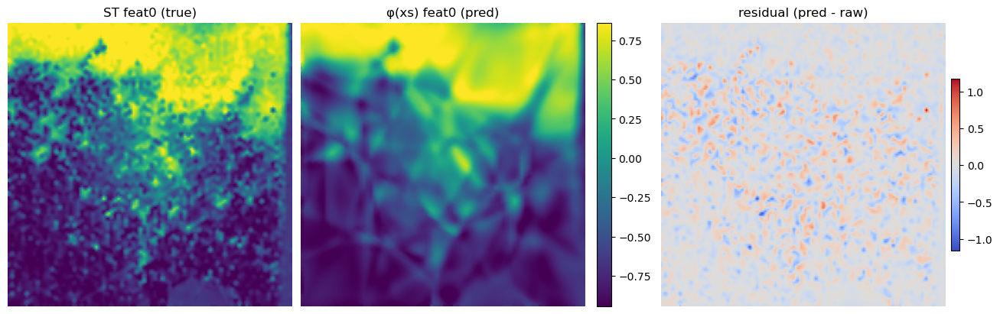

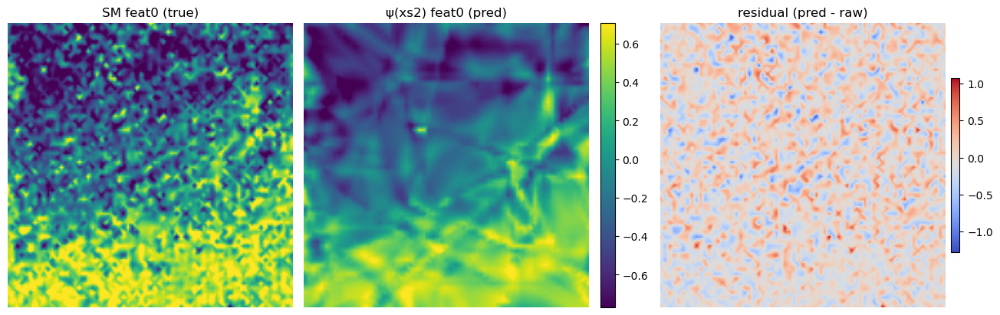

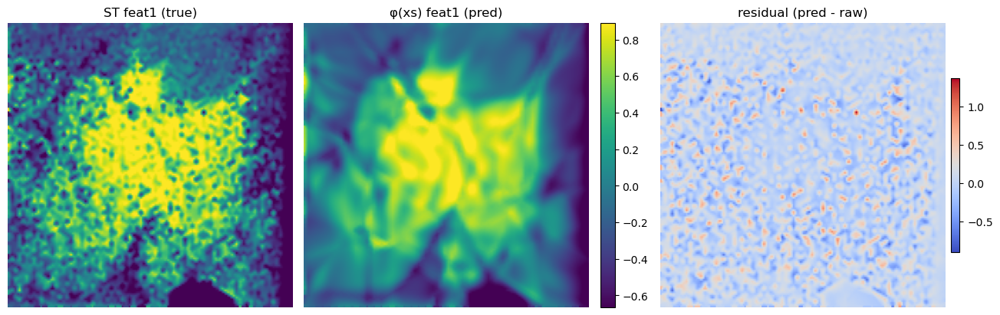

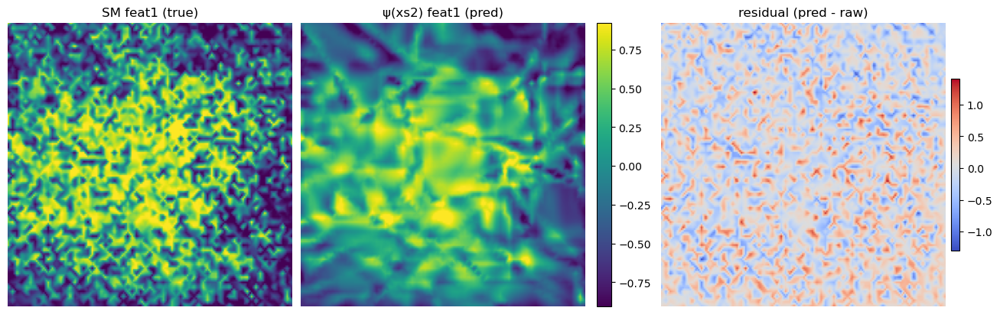

[mgw.core] pullback metrics & geodesics
Rescaling Jacobians by 107.58395910031727.
Rescaling Jacobians by 339.28824682990967.
[mgw.core] solving GW with {'verbose': True, 'inner_maxit': 3000, 'outer_maxit': 3000, 'inner_tol': 1e-07, 'outer_tol': 1e-07, 'epsilon': 0.0001}
[mgw.core] coupling: shape=(4968, 4030), mass=0.999991


In [5]:
import mgw.mgw as mgw
import scanpy as sc
from mgw import util
from mgw import gw

import importlib
importlib.reload(gw)
importlib.reload(mgw)
importlib.reload(util)

pre = mgw.mgw_preprocess(
    st, msi,
    PCA_comp=8,
    CCA_comp=3,
    use_cca_feeler=True,
    use_pca_X=True,
    use_pca_Z=False,
    log1p_X=True,
    log1p_Z=False,
    verbose=True,
)

out = mgw.mgw_align_core(
    pre,
    widths=(128,256,256,128),
    lr=1e-3,
    niter=20_000,
    knn_k=12,
    geodesic_eps=1e-2,
    save_dir="/scratch/gpfs/ph3641/mgw/mgw_temp2",
    tag="st_msi_V11T17-102_A1",
    verbose=True,
    plot_net=True
)

P = out["P"]


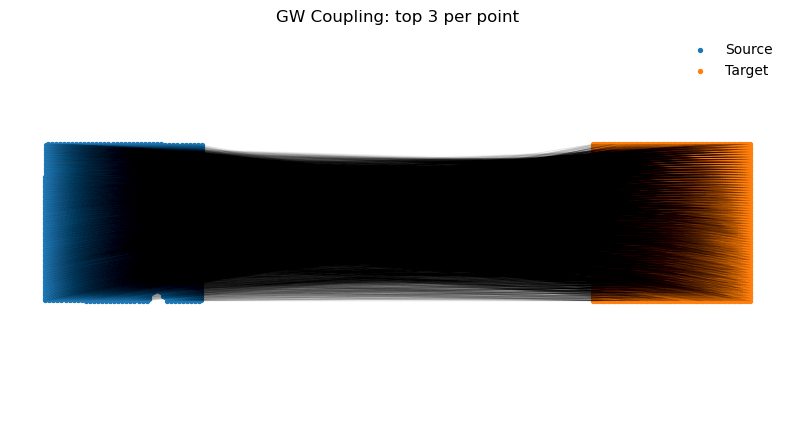

In [6]:
from mgw import plotting

xs = out["xs"]
xs2 = out["xs2"]

plotting.plot_alignment_lines_dense(xs, xs2, P, alpha=0.05)


ST: 4968 spots, 17943 genes   |   MSI: 4030 pixels, 20 m/z
761.6585344662074
MSI→ST (via Learned_P, DA_double): AUROC=0.996 | AUPRC=0.923


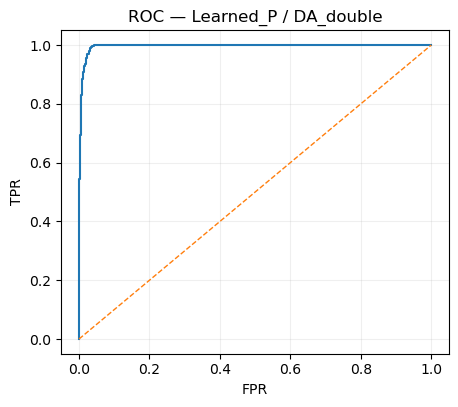

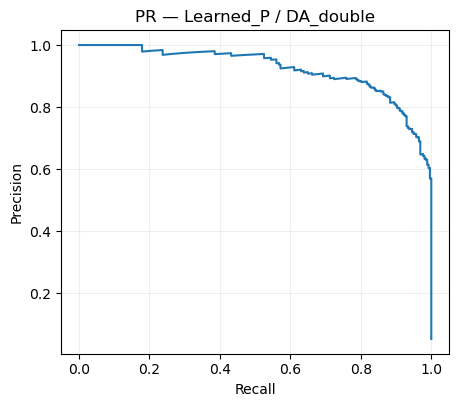

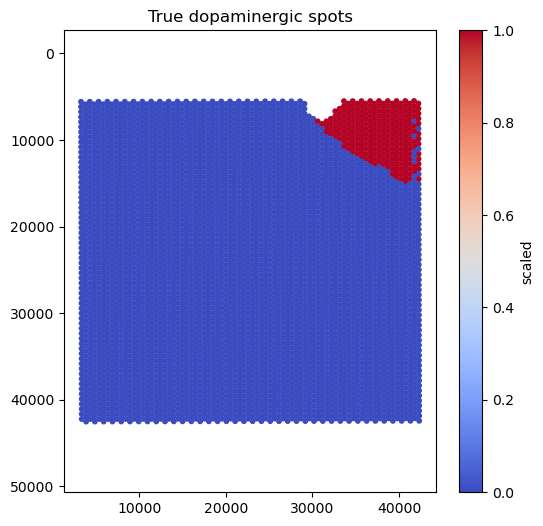

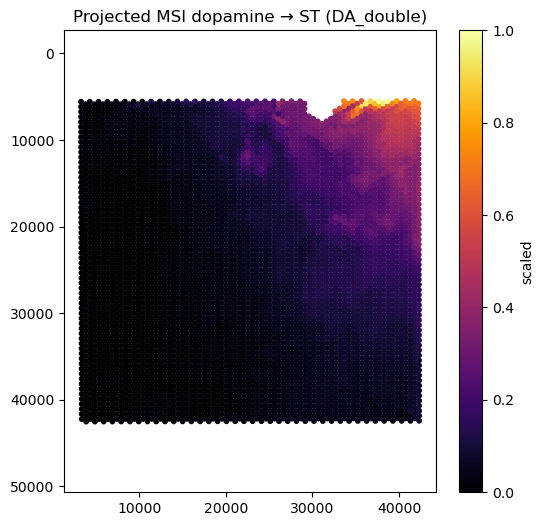

In [7]:
from validation import dopamine as dp
import scipy.sparse as sp
importlib.reload(dp)

# ---------- inputs, P, targets ----------
print(f"ST: {st.n_obs} spots, {st.n_vars} genes   |   MSI: {msi.n_obs} pixels, {msi.n_vars} m/z")
P = out["P"] if isinstance(out,dict) and "P" in out else P
P = sp.csr_matrix(P) if not sp.issparse(P) else P
P_learned = dp.orient_P(P, st.n_obs, msi.n_obs)

targets = {"DA_single":421.19, "DA_double":674.28, "3MT":435.21}

# ---------- single evaluation (mirrors your earlier block) ----------
auroc, auprc, s_proj, s_raw = dp.eval_proj(P_learned, targets["DA_double"], msi, st)
print(f"MSI→ST (via Learned_P, DA_double): AUROC={auroc:.3f} | AUPRC={auprc:.3f}")

# curves + spatial map
y_bin = st.obs["dopamine"].astype(str).isin(["dopamine_Cd"]).astype(int).to_numpy() # "CI"

dp.plot_curves(y_bin, s_proj, "Learned_P / DA_double")
dp.plot_spatial(st.obsm["spatial"], y_bin.astype(float), "True dopaminergic spots", cmap="coolwarm")
dp.plot_spatial(st.obsm["spatial"], s_proj, "Projected MSI dopamine → ST (DA_double)")


In [8]:

Z_s = pre["X_rep"]
Z_m = pre["Z_rep"]


In [9]:
from validation import run_methods as rm
importlib.reload(rm)
import os, scipy.sparse as sp
from functools import partial

ALIGN_DIR = "/scratch/gpfs/ph3641/mgw/SM_Alignments2"

def _load_or_run(name: str, func, *args, **kwargs):
    """Load alignment if exists; otherwise run and save."""
    os.makedirs(ALIGN_DIR, exist_ok=True)
    path = os.path.join(ALIGN_DIR, f"{name}.npz")
    
    if os.path.exists(path):
        print(f"[cached] {name}: loading from {path}")
        return sp.load_npz(path)

    print(f"[run] {name}: computing alignment...")
    P = func(*args, **kwargs)
    if P is not None:
        sp.save_npz(path, P)
        print(f"[saved] {name}: {path}")
    return P


def run_MGW(pre):
    try:
        out = mgw.mgw_align_core(
            pre,
            widths=(128,256,256,128),
            lr=1e-3,
            niter=20_000,
            knn_k=12,
            geodesic_eps=1e-2,
            save_dir="/scratch/gpfs/ph3641/mgw/mgw_temp2",
            tag="st_msi_V11T17-102_A1",
            verbose=True,
            plot_net=True
        )
        P = out["P"]
        return sp.csr_matrix(P)
    
    except Exception as e:
        print(f"[skip] M-GW: {e}")
        return None

methods = {
    "PASTE2": _load_or_run(
        "PASTE2",
        partial(rm.run_paste_spatial_only, st, msi),
    ),
    "POT_GW_spatial": _load_or_run(
        "POT_GW_spatial",
        partial(rm.run_pot_fgw_spatial, st, msi),
    ),
    "Manifold GW": _load_or_run(
        "Manifold_GW",
        partial(run_MGW, pre)
    ),
    "MOSCOT_translation": _load_or_run(
        "MOSCOT_translation",
        partial(rm.run_moscot, st, msi, Z_s, Z_m),
    ),
    "SCOT_v1": _load_or_run(
        "SCOT_v1",
        partial(rm.run_scot, Z_s, Z_m, k=50, epsilon=0.005, norm=True),
    ),
    "SCOT_v2": _load_or_run(
        "SCOT_v2",
        partial(rm.run_scot_v2, Z_s, Z_m, k=50, epsilon=1e-3, norm=True),
    ),
}

[cached] PASTE2: loading from /scratch/gpfs/ph3641/mgw/SM_Alignments2/PASTE2.npz
[cached] POT_GW_spatial: loading from /scratch/gpfs/ph3641/mgw/SM_Alignments2/POT_GW_spatial.npz
[cached] Manifold_GW: loading from /scratch/gpfs/ph3641/mgw/SM_Alignments2/Manifold_GW.npz
[cached] MOSCOT_translation: loading from /scratch/gpfs/ph3641/mgw/SM_Alignments2/MOSCOT_translation.npz
[cached] SCOT_v1: loading from /scratch/gpfs/ph3641/mgw/SM_Alignments2/SCOT_v1.npz
[cached] SCOT_v2: loading from /scratch/gpfs/ph3641/mgw/SM_Alignments2/SCOT_v2.npz


In [10]:

ST_PATH = "/scratch/gpfs/ph3641/mgw/sma_data/adata_st_V11T17-102_A1.h5ad"
MSI_PATH = "/scratch/gpfs/ph3641/mgw/sma_data/adata_msi_V11T17-102_A1.h5ad"

st = ad.read_h5ad(ST_PATH)
msi = ad.read_h5ad(MSI_PATH)

dop = pd.read_csv(
    "/scratch/gpfs/ph3641/mgw/sma_data/mendeley_all/Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues/"
    "processed/sma/sma/V11T17-102/V11T17-102_A1/output_data/V11T17-102_A1_RNA/outs/dopamine.csv"
)

# merge on barcode (Visium barcode format matches .obs_names)
dop = dop.rename(columns={"Barcode": "barcode"})
st.obs = st.obs.merge(dop, how="left", left_index=True, right_on="barcode")
st.obs["dopamine"] = st.obs["dopamine"].astype("category")
print(st.obs["dopamine"].value_counts())


dopamine
not_dopamine_Cd    3745
CI                  939
dopamine_Cd         257
Name: count, dtype: int64


Available methods: ['PASTE2', 'POT_GW_spatial', 'Manifold GW', 'MOSCOT_translation', 'SCOT_v1', 'SCOT_v2']
268.1393901092923
335.2124553774253
528.62856024503
1425.0222722069084
544.8751185606
722.8084643726589
988.6911795440285
1976.6080305288315
544.8775180025389
722.8120102508151
988.6953045448255
1976.6095162983422
544.7744399975512
722.6867522379907
988.6220051892153
1976.6600481075843
544.8751295589566
722.8084796513141
988.6911984547437
1976.6080358831255
544.8574537175373
722.7478546006867
988.7554410398548
1976.5687429947152
            method       target     mz    AUROC    AUPRC
       Manifold GW          3MT 435.21 0.990643 0.846338
            PASTE2          3MT 435.21 0.666854 0.084050
MOSCOT_translation          3MT 435.21 0.614658 0.062674
    POT_GW_spatial          3MT 435.21 0.522156 0.081316
           SCOT_v2          3MT 435.21 0.485687 0.050856
           SCOT_v1          3MT 435.21 0.379571 0.038266
       Manifold GW    DA_double 674.28 0.994665 0.907437
    

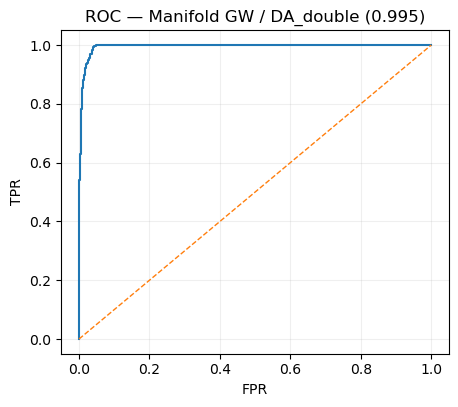

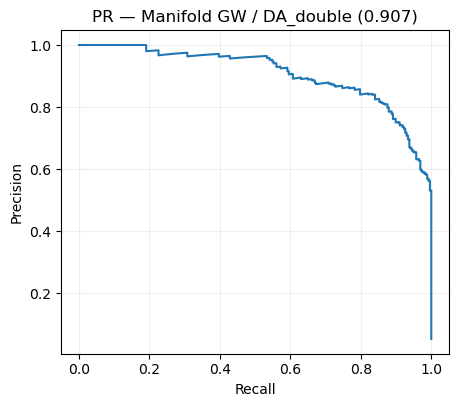

ST: 4968 spots, 17943 genes   |   MSI: 4030 pixels, 1538 m/z
335.2124553774253
MSI→ST (via Learned_P, DA_double): AUROC=0.674 | AUPRC=0.090


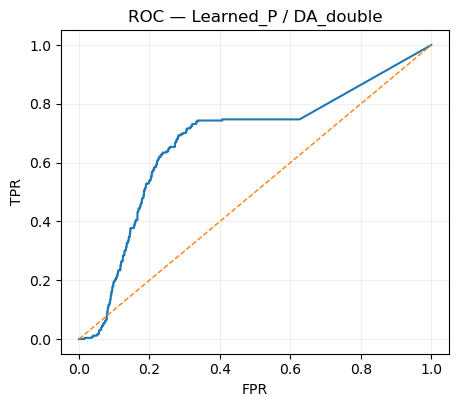

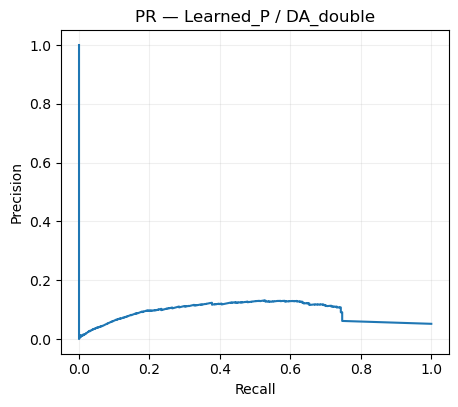

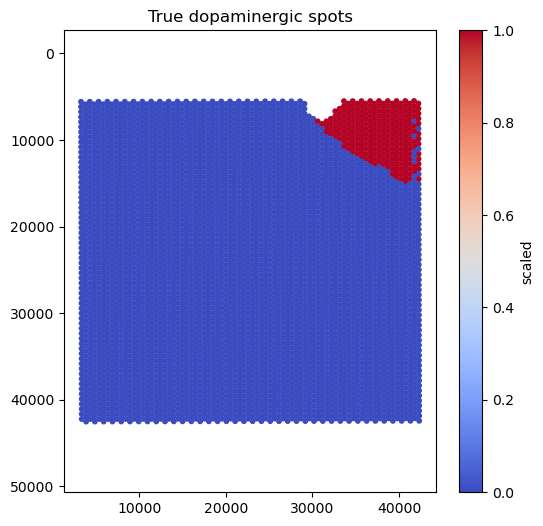

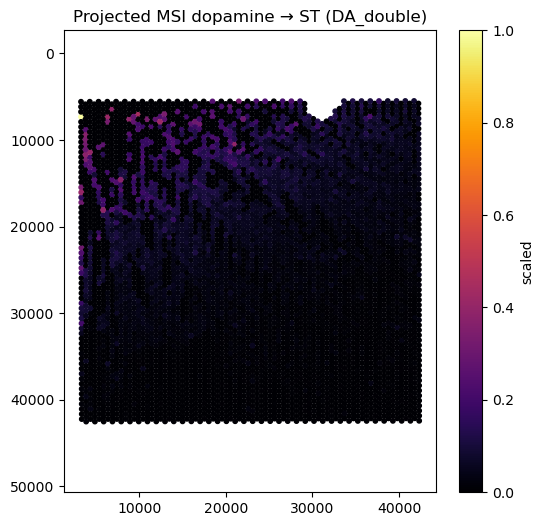

ST: 4968 spots, 17943 genes   |   MSI: 4030 pixels, 1538 m/z
722.8084643726589
MSI→ST (via Learned_P, DA_double): AUROC=0.536 | AUPRC=0.085


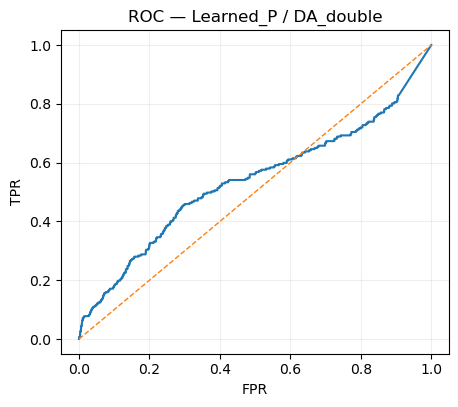

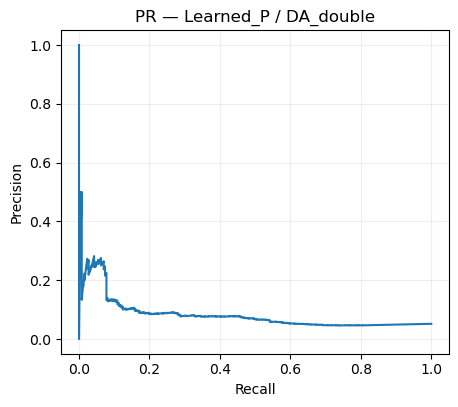

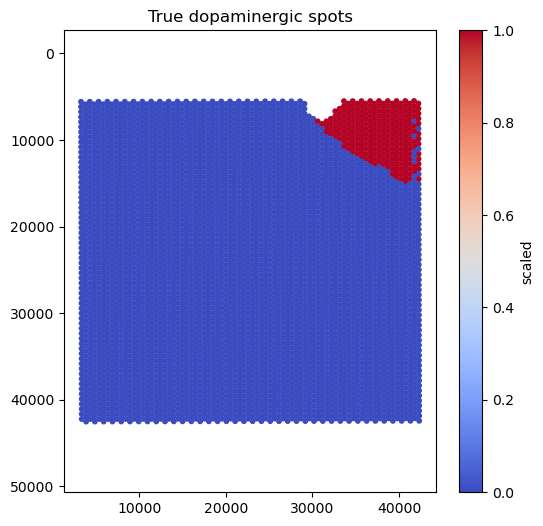

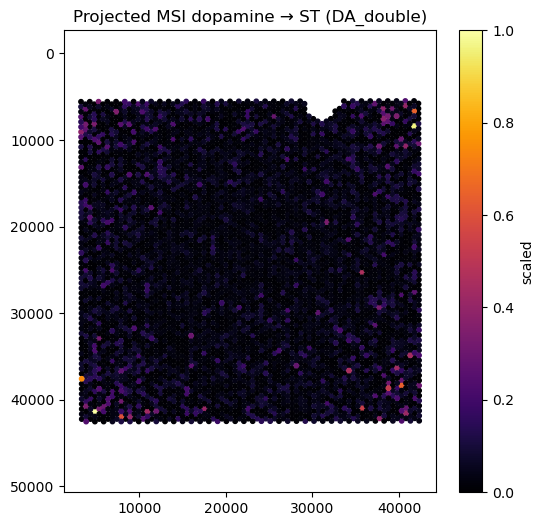

ST: 4968 spots, 17943 genes   |   MSI: 4030 pixels, 1538 m/z
722.8120102508151
MSI→ST (via Learned_P, DA_double): AUROC=0.995 | AUPRC=0.907


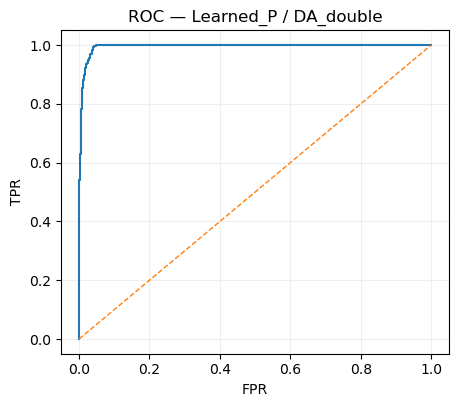

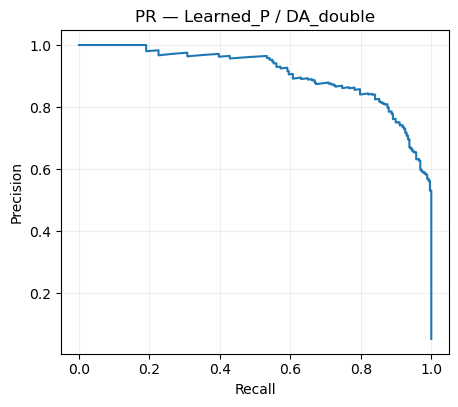

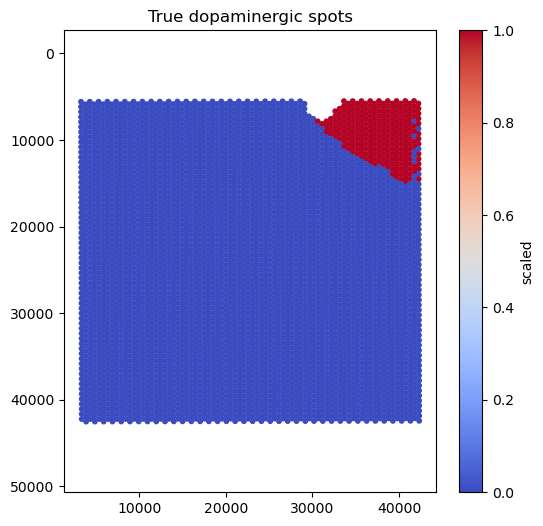

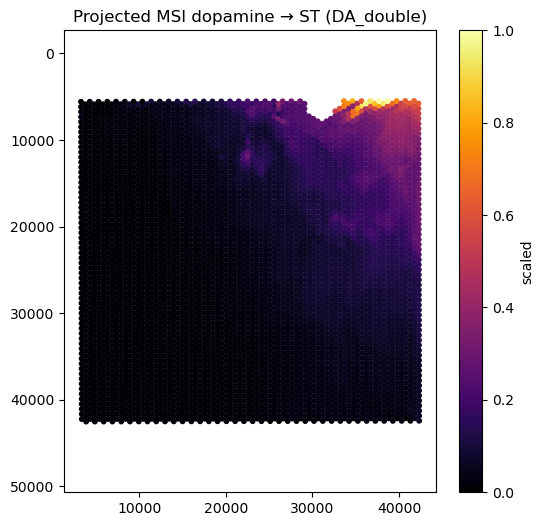

ST: 4968 spots, 17943 genes   |   MSI: 4030 pixels, 1538 m/z
722.6867522379907
MSI→ST (via Learned_P, DA_double): AUROC=0.590 | AUPRC=0.058


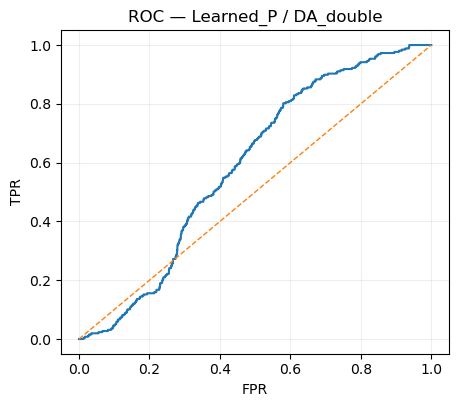

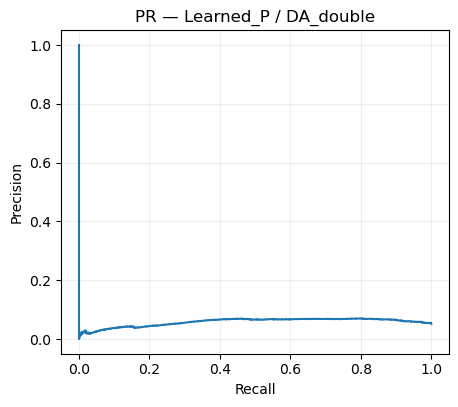

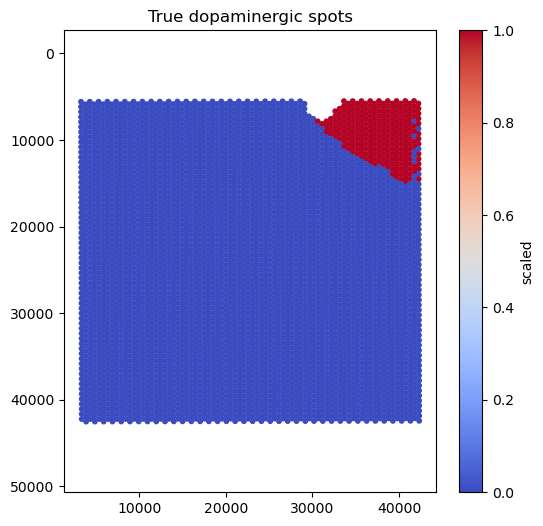

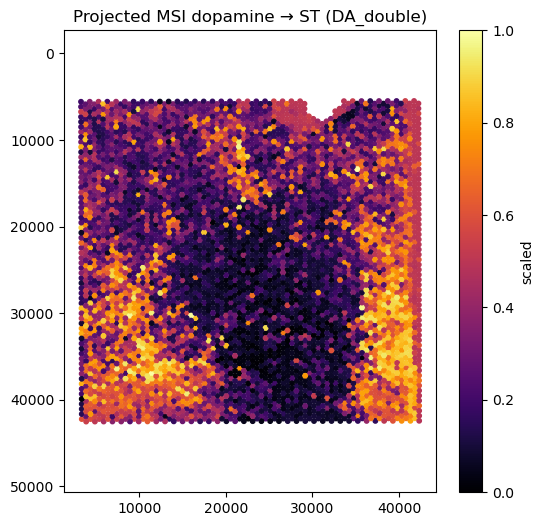

ST: 4968 spots, 17943 genes   |   MSI: 4030 pixels, 1538 m/z
722.8084796513141
MSI→ST (via Learned_P, DA_double): AUROC=0.353 | AUPRC=0.037


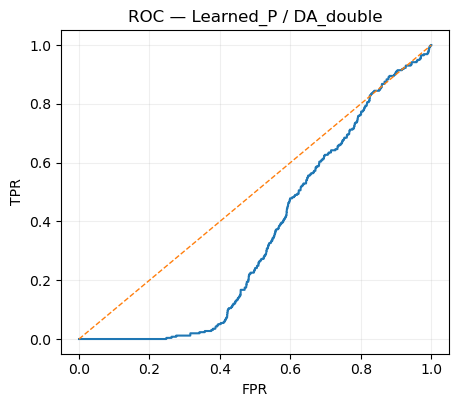

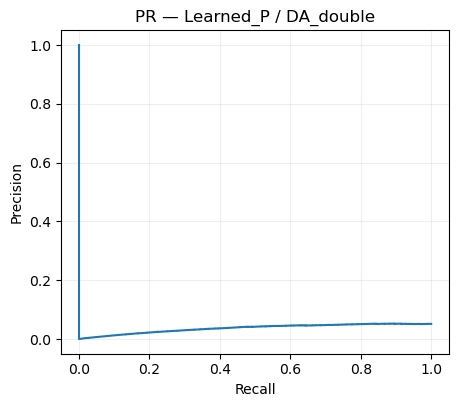

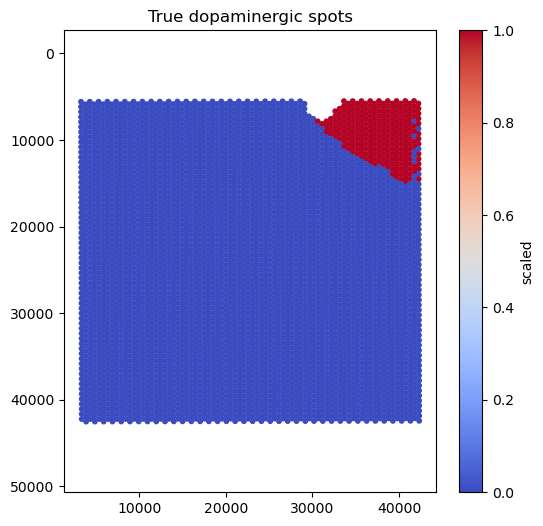

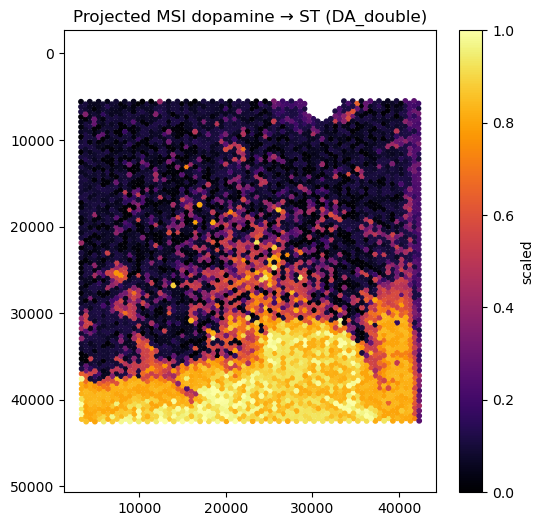

ST: 4968 spots, 17943 genes   |   MSI: 4030 pixels, 1538 m/z
722.7478546006867
MSI→ST (via Learned_P, DA_double): AUROC=0.486 | AUPRC=0.051


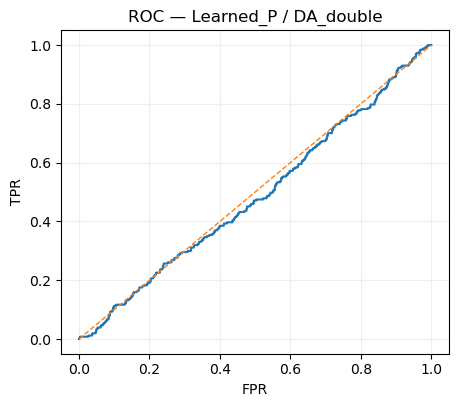

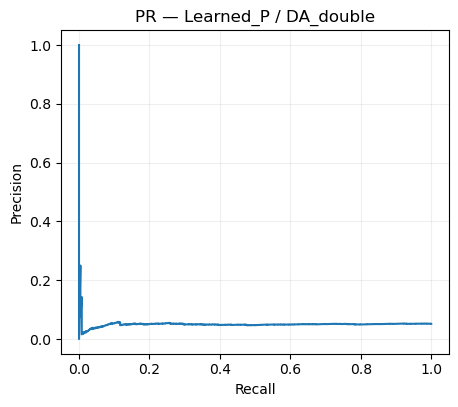

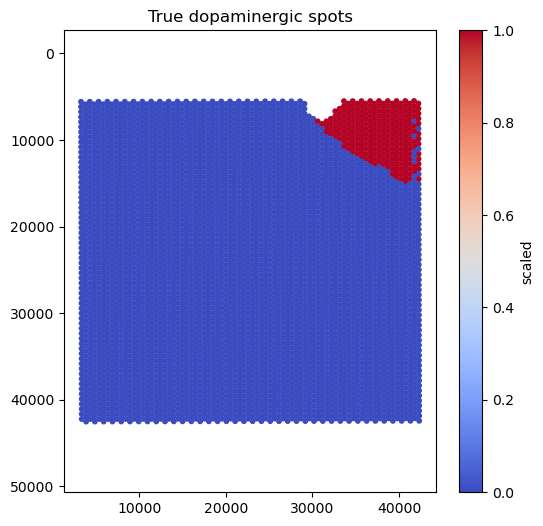

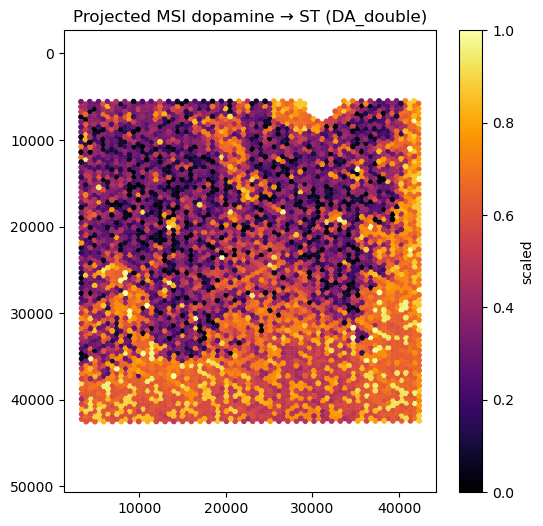

In [11]:

methods = {k:v for k,v in methods.items() if v is not None}
print("Available methods:", list(methods.keys()))

targets = {"DA_single":421.19, "DA_double":674.28, "3MT":435.21, "DOPAC_double": 698.24}

recs, scores_cache, scores_cache_raw = [], {}, {}

for mname, Pm in methods.items():
    for tname, mzv in targets.items():
        P = sp.csr_matrix(Pm) if not sp.issparse(Pm) else Pm
        P_learned = dp.orient_P(P, st.n_obs, msi.n_obs)
        auroc, auprc, s, s_raw = dp.eval_proj(Pm, mzv, msi, st)
        recs.append({"method": mname, "target": tname, "mz": mzv, "AUROC": auroc, "AUPRC": auprc})
        scores_cache[(mname,tname)] = s
        scores_cache_raw[(mname,tname)] = s_raw

df_all = pd.DataFrame(recs).sort_values(["target","AUROC"], ascending=[True, False])
print(df_all.to_string(index=False))

# Plot the best overall
y = st.obs["dopamine"].astype(str).isin(["dopamine_Cd"]).astype(int).to_numpy()
best = df_all.sort_values("AUROC", ascending=False).iloc[0]
s = scores_cache[(best["method"], best["target"])]
fpr, tpr, _ = dp.roc_curve(y, s)
prec, rec, _ = dp.precision_recall_curve(y, s)
plt.figure(figsize=(5,4.2)); plt.plot(fpr,tpr); plt.plot([0,1],[0,1],'--',lw=1)
plt.xlabel("FPR"); plt.ylabel("TPR"); plt.title(f"ROC — {best['method']} / {best['target']} ({best['AUROC']:.3f})"); plt.grid(alpha=.2); plt.show()
plt.figure(figsize=(5,4.2)); plt.plot(rec,prec)
plt.xlabel("Recall"); plt.ylabel("Precision"); plt.title(f"PR — {best['method']} / {best['target']} ({best['AUPRC']:.3f})"); plt.grid(alpha=.2); plt.show()

for mname, Pm in methods.items():
    
    # ---------- inputs, P, targets ----------
    print(f"ST: {st.n_obs} spots, {st.n_vars} genes   |   MSI: {msi.n_obs} pixels, {msi.n_vars} m/z")
    
    P = sp.csr_matrix(Pm) if not sp.issparse(Pm) else Pm
    P_learned = dp.orient_P(P, st.n_obs, msi.n_obs)
    
    targets = {"DA_single":421.19, "DA_double":674.28, "3MT":435.21, "DOPAC_double": 698.24}
    
    # ---------- single evaluation (mirrors your earlier block) ----------
    auroc, auprc, s_proj, s_raw = dp.eval_proj(P_learned, targets["DA_double"], msi, st)
    print(f"MSI→ST (via Learned_P, DA_double): AUROC={auroc:.3f} | AUPRC={auprc:.3f}")
    
    # curves + spatial map
    y_bin = st.obs["dopamine"].astype(str).isin(["dopamine_Cd"]).astype(int).to_numpy() # "CI"
    dp.plot_curves(y_bin, s_proj, "Learned_P / DA_double")
    dp.plot_spatial(st.obsm["spatial"], y_bin.astype(float), "True dopaminergic spots", cmap="coolwarm")
    dp.plot_spatial(st.obsm["spatial"], s_proj, "Projected MSI dopamine → ST (DA_double)")


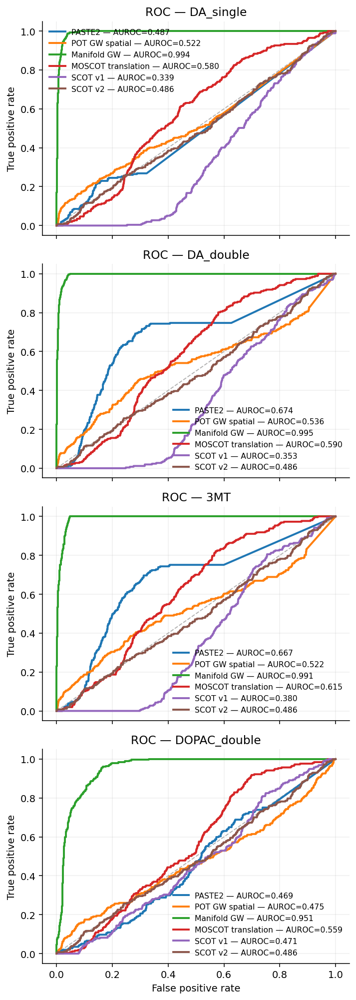

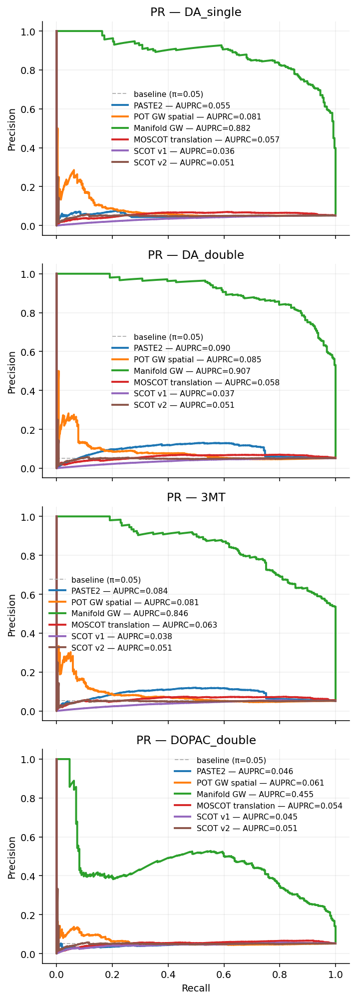

In [15]:
import numpy as np, matplotlib.pyplot as plt, matplotlib as mpl
from sklearn.metrics import roc_curve, precision_recall_curve

# -------------------------
# Global aesthetics (journal-friendly)
# -------------------------
mpl.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 300,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.grid": True,
    "grid.alpha": 0.2,
    "font.size": 10,
})

# Convenience: order & pretty names
method_order = list(methods.keys())  # or manually set an order if you prefer
pretty = lambda s: s.replace("_", " ").replace("MOSCOT", "MOSCOT").replace("GW", "GW")

# Build y (positives = dopamine_Cd)
y = st.obs["dopamine"].astype(str).isin(["dopamine_Cd"]).astype(int).to_numpy()
pos_rate = y.mean()

# -------------------------
# 1) ROC / PR grids per metabolite
# -------------------------
def plot_roc_pr_grids(df_all, scores_cache, y, targets, method_order=None, out_prefix="benchmark"):
    tnames = list(targets.keys())
    if method_order is None:
        method_order = sorted(df_all["method"].unique())

    # --- ROC grid ---
    nrows, ncols = len(tnames), 1
    fig_roc, axes_roc = plt.subplots(nrows, ncols, figsize=(5.2, 3.6*len(tnames)), sharex=True, sharey=True)
    axes_roc = np.atleast_1d(axes_roc)

    for ri, tname in enumerate(tnames):
        ax = axes_roc[ri]
        # Diagonal
        ax.plot([0,1], [0,1], ls="--", lw=1, color="0.7", zorder=0)
        # Methods
        subset = df_all[df_all["target"] == tname]
        # Sort by AUROC desc for legend readability
        subset = subset.sort_values("AUROC", ascending=False)
        used = []
        for m in method_order:
            row = subset[subset["method"] == m]
            if row.empty: 
                continue
            s = scores_cache.get((m, tname))
            if s is None: 
                continue
            fpr, tpr, _ = roc_curve(y, s)
            auroc = row["AUROC"].values[0]
            lbl = f"{pretty(m)} — AUROC={auroc:.3f}"
            ax.plot(fpr, tpr, lw=2, label=lbl)
            used.append(m)
        ax.set_title(f"ROC — {tname}")
        if ri == len(tnames)-1:
            ax.set_xlabel("False positive rate")
        ax.set_ylabel("True positive rate")
        ax.legend(frameon=False, fontsize=8)

    fig_roc.tight_layout()
    fig_roc.savefig(f"{out_prefix}_ROC_grid.svg"); fig_roc.savefig(f"{out_prefix}_ROC_grid.png")
    plt.show()

    # --- PR grid ---
    fig_pr, axes_pr = plt.subplots(nrows, ncols, figsize=(5.2, 3.6*len(tnames)), sharex=True, sharey=True)
    axes_pr = np.atleast_1d(axes_pr)

    for ri, tname in enumerate(tnames):
        ax = axes_pr[ri]
        # Baseline at prevalence
        ax.hlines(pos_rate, 0, 1, ls="--", lw=1, color="0.7", label=f"baseline (π={pos_rate:.2f})", zorder=0)
        subset = df_all[df_all["target"] == tname].sort_values("AUPRC", ascending=False)
        used = []
        for m in method_order:
            row = subset[subset["method"] == m]
            if row.empty: 
                continue
            s = scores_cache.get((m, tname))
            if s is None: 
                continue
            prec, rec, _ = precision_recall_curve(y, s)
            auprc = row["AUPRC"].values[0]
            lbl = f"{pretty(m)} — AUPRC={auprc:.3f}"
            ax.plot(rec, prec, lw=2, label=lbl)
            used.append(m)
        ax.set_title(f"PR — {tname}")
        if ri == len(tnames)-1:
            ax.set_xlabel("Recall")
        ax.set_ylabel("Precision")
        ax.legend(frameon=False, fontsize=8)

    fig_pr.tight_layout()
    fig_pr.savefig(f"{out_prefix}_PR_grid.svg"); fig_pr.savefig(f"{out_prefix}_PR_grid.png")
    plt.show()

# -------------------------
# 2) Spatial maps: ground truth vs. projected intensity per method
# -------------------------
import numpy as np, matplotlib.pyplot as plt
import scipy.sparse as sp
from sklearn.preprocessing import MinMaxScaler
import matplotlib.colors as mcolors

def plot_spatial_panel(
    st,
    scores_cache_raw,
    target_key="DA_double",
    method_order=None,
    out_prefix="spatial",
    point_size=0.3,
    cmap="coolwarm",
    scale_to_max=False
):
    # figure out which methods we can actually plot for this target
    if method_order is None:
        method_order = sorted({m for (m, t) in scores_cache_raw.keys() if t == target_key})
    method_order = [m for m in method_order if (m, target_key) in scores_cache_raw]

    # spatial coords
    xy = np.asarray(st.obsm["spatial"], dtype=float)
    
    # --- Ground truth: explicit binary 0/1 vector ---
    y_bin = (
        st.obs["dopamine"].astype(str).isin(["dopamine_Cd"])
        .astype(int)
        .to_numpy()
    )  # 0/1
    
    # --- Global min-max scaling for all method scores (consistent color scale) ---
    # stack all available score vectors for this target and fit a single scaler
    ss_all = [np.asarray(scores_cache_raw[(m, target_key)], dtype=float).reshape(-1, 1) for m in method_order]
            
    if len(ss_all) == 0:
        raise ValueError(f"No scores available in scores_cache for target_key='{target_key}'.")
    stack = np.concatenate(ss_all, axis=0)
    # replace NaNs/Infs safely before scaling (robustness)
    stack = np.nan_to_num(stack, nan=0.0, posinf=np.nanmax(stack[np.isfinite(stack)]) if np.isfinite(stack).any() else 0.0, neginf=0.0)

    scaler = MinMaxScaler(feature_range=(0.0, 1.0))
    scaler.fit(stack)

    # precompute normalized scores per method
    scores_norm = {}
    for m in method_order:
        s = np.asarray(scores_cache_raw[(m, target_key)], dtype=float).reshape(-1, 1)
        s = np.nan_to_num(s, nan=0.0)  # robust
        s_norm = scaler.transform(s).ravel()
        scores_norm[m] = s_norm

    if scale_to_max:
        m_scale = 0
        for m in method_order:
            sum_s = scores_norm[m].sum()
            m_scale+=sum_s
            '''
            if sum_s > m_scale:
                m_scale = sum_s'''
        m_scale = m_scale / len(method_order)
        for m in method_order:
            scores_norm[m] = scores_norm[m] * (m_scale / scores_norm[m].sum())
    
    # --- Set a single normalization & cmap so GT and projections share endpoints ---
    norm_01 = mcolors.Normalize(vmin=0.0, vmax=1.0)
    cmap_use = plt.get_cmap(cmap)

    # layout: ground truth + one panel per method
    ncols = 1 + len(method_order)
    fig, axes = plt.subplots(1, ncols, figsize=(3.6 * ncols, 3.6), squeeze=False)

    # 1) Ground-truth panel (shares same cmap & [0,1] range)
    ax = axes[0, 0]
    sc0 = ax.scatter(xy[:, 0], xy[:, 1], c=y_bin.astype(float), s=point_size, cmap=cmap_use, norm=norm_01)
    ax.set_title("Ground truth (dopamine_Cd)")
    ax.invert_yaxis(); ax.axis("equal"); ax.set_xticks([]); ax.set_yticks([])
    cb0 = plt.colorbar(sc0, ax=ax, fraction=0.046, pad=0.04)
    cb0.set_label("label")
    cb0.set_ticks([0.0, 0.5, 1.0]); cb0.set_ticklabels(["0", "0.5", "1"])

    # 2) One subplot per method, normalized identically to GT
    for j, m in enumerate(method_order, start=1):
        ax = axes[0, j]
        s_norm = scores_norm[m]
        sc = ax.scatter(xy[:, 0], xy[:, 1], c=s_norm, s=point_size, cmap=cmap_use, norm=norm_01)
        ax.set_title(m)  # or pretty(m) if you have that helper
        ax.invert_yaxis(); ax.axis("equal"); ax.set_xticks([]); ax.set_yticks([])
        cb = plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
        cb.set_label(f"{target_key} (proj.)")
        cb.set_ticks([0.0, 0.5, 1.0]); cb.set_ticklabels(["0", "0.5", "1"])

    fig.suptitle(f"Spatial maps — {target_key}", y=1.02, fontsize=12)
    fig.tight_layout()
    fig.savefig(f"{out_prefix}_{target_key}.svg")
    fig.savefig(f"{out_prefix}_{target_key}.png", dpi=300)
    plt.show()

# -------------------------
# Run the plots
# -------------------------
plot_roc_pr_grids(df_all, scores_cache, y, targets, method_order=method_order, out_prefix="SMAlign_benchmark")

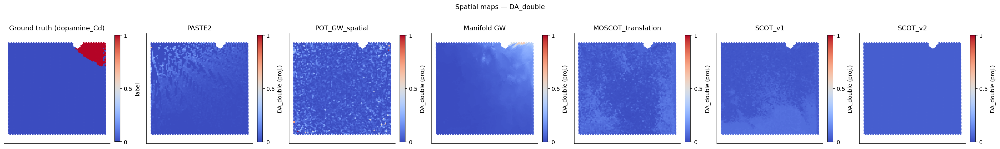

In [16]:
# Spatial: use DA_double (you can swap to "3MT" or "DA_single")
plot_spatial_panel(st, scores_cache_raw, target_key="DA_double", method_order=method_order, out_prefix="SMAlign_spatial_raw", point_size=5)

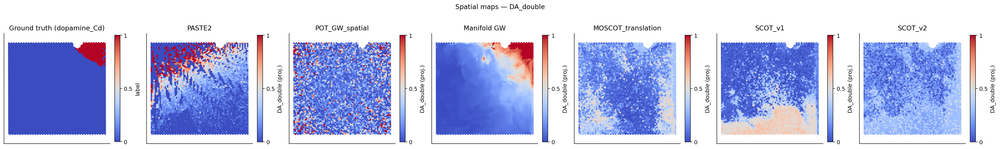

In [17]:
plot_spatial_panel(st, scores_cache, target_key="DA_double",
                   method_order=method_order, out_prefix="SMAlign_spatial_scaled", scale_to_max=True, point_size=5)